<a href="https://colab.research.google.com/github/indrakumarmhaski/MIT_DL_MusicGeneration/blob/master/MITlab1MusicGeneration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

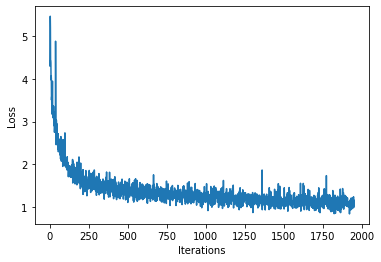

  3%|▎         | 28/1000 [00:00<00:03, 272.55it/s]

Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_25 (Embedding)     (1, None, 256)            21248     
_________________________________________________________________
lstm_25 (LSTM)               (1, None, 1024)           5246976   
_________________________________________________________________
dense_25 (Dense)             (1, None, 83)             85075     
Total params: 5,353,299
Trainable params: 5,353,299
Non-trainable params: 0
_________________________________________________________________


100%|██████████| 1000/1000 [00:03<00:00, 263.19it/s]


Found 5 songs in text
Generated song 1


Generated song 3


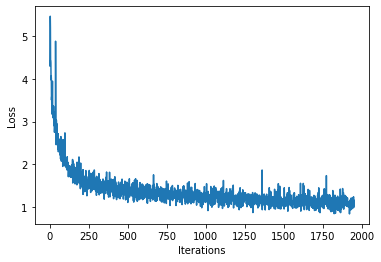

In [0]:
%tensorflow_version 2.0
import tensorflow as tf
!pip install mitdeeplearning
import mitdeeplearning as mdl
import numpy as np
import os
import time
import functools
from IPython import display as ipythondisplay
from tqdm import tqdm
!apt-get install abcmidi timidity > /dev/null 2>&1


# Downloading the dataset
songs = mdl.lab1.load_training_data()

# Joining all the songs together in a variable
songs_joined = "\n\n".join(songs)

# Finding all the unique characters in the joined string
vocab = sorted(set(songs_joined))

# Creating a mapping from character to unique index
char2idx = {u:i for i, u in enumerate(vocab)}

# Creating a mapping from indices to characters
idx2char = np.array(vocab)

# A function to convert the all songs string to a vectorized i.e numeric representation
def vectorize_string(string):
  vectorized_output = np.array([char2idx[char] for char in string])
  return vectorized_output

vectorized_songs = vectorize_string(songs_joined)

# Creating training examples and targets
def get_batch(vectorized_songs, seq_length, batch_size):
  # The length of the vectorized songs string
  n = vectorized_songs.shape[0]-1
  # Randomply choosing the starting indices for the examples in the training batch
  idx = np.random.choice(n-seq_length, batch_size)
  # Creating a list of input sequences for the training batch
  input_batch = [vectorized_songs[i: i+seq_length] for i in idx]
  # Creating a list of output sequences for the training batch
  output_batch = [vectorized_songs[i+1: i+seq_length+1] for i in idx]
  # x_batch. y_batch provide the true inputs and targets for network training
  x_batch = np.reshape(input_batch, [batch_size, seq_length] )
  y_batch = np.reshape(output_batch, [batch_size, seq_length])
  return x_batch, y_batch

x_batch, y_batch = get_batch(vectorized_songs, seq_length=5, batch_size=1)

# RNN part

# A fucntion to actually build the model
def LSTM(rnn_units):
  return tf.keras.layers.LSTM(
      rnn_units,
      return_sequences=True,
      recurrent_initializer='glorot_uniform',
      recurrent_activation='sigmoid',
      stateful=True,
  )

# Defining the RNN Model
def build_model(vocab_size, embedding_dim, rnn_units, batch_size):
  model = tf.keras.Sequential([
    # Layer 1: Embedding layer to transform indices into dense vectors of a
    # fixed embedding size
    tf.keras.layers.Embedding(vocab_size, embedding_dim, batch_input_shape=[batch_size, None]),

    # Layer 2: LSTM with 'rnn_units' units
    LSTM(rnn_units),

    # Layer 3: Dense layer that transforms the LSTM output into the vocabulary size.
    tf.keras.layers.Dense(vocab_size)
  ])
  return model

# Building a simple model with default hyperparameters
model = build_model(len(vocab), embedding_dim=256, rnn_units=1024, batch_size=32)

model.summary()

# getting training examples and targets
x, y = get_batch(vectorized_songs, seq_length=100, batch_size=32)

# Making predection
pred = model(x)


# Training the model: Loss and training operations
# A function to compute the losse
def compute_loss(labels, logits):
  loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)
  return loss
# Computing the loss using the true next characters from the example batch and the predictions
# from the untrained model
example_batch_loss = compute_loss(y, pred)


# Hyperparameter setting and optimization

# Optimization parameters:
numt_training_iterations = 2000
batch_size = 4
seq_length = 100
learning_rate = 5e-3
# Model parameters:
vocab_size = len(vocab)
embedding_dim = 256
rnn_units = 1024
# checkpoint location:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "my_ckpt")


# Definging optimizer and training operations
# Instantiating a new model for training using the 'build model' function 
# and the hyperparameters created above
model = build_model(vocab_size, embedding_dim, rnn_units, batch_size)
# Instantiating an optimizer with its learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate)

@tf.function
def train_step(x,y):
  with tf.GradientTape() as tape:
    # Feeding the current input into the model and generating predictions
    y_hat = model(x)
    loss = compute_loss(y, y_hat)
  # Computing the gradients, we want the gradient of the loss with respect to all
  # of the model parameters so will use 'model.trainable_variables' to get a list 
  # of all model parameters
  grads = tape.gradient(loss, model.trainable_variables)
  # Appplying the gradients to the optimizer so it can update the model accordigly
  optimizer.apply_gradients(zip(grads, model.trainable_variables))
  return loss


# Beggining of Training!!!

history = []
plotter = mdl.util.PeriodicPlotter(sec=2, xlabel='Iterations', ylabel='Loss')
if hasattr(tqdm, '_instances'): tqdm._instances.clear() #Clear if it exists

for iter in tqdm(range(numt_training_iterations)):
  # Grabbing a batch and propagate it through the network
  x_batch, y_batch = get_batch(vectorized_songs, seq_length, batch_size)
  loss = train_step(x_batch, y_batch)

  # Update the progress bar
  history.append(loss.numpy().mean())
  plotter.plot(history)
  
  # Update the model with the changed weights!
  if iter % 100 == 0:
    model.save_weights(checkpoint_prefix)

# Save the trained model and the weights
model.save_weights(checkpoint_prefix)

# Generating music using the RNN model
# Rebuild the model using a batch_size=1
model = build_model(vocab_size, embedding_dim, rnn_units, batch_size=1)
# Restore the model wights for the last checkpoint after training
model.load_weights(tf.train.latest_checkpoint(checkpoint_dir))
model.build(tf.TensorShape([1, None]))

model.summary()

# Prediction of a generated song
def generate_text(model, start_string, generation_length=1000):
  # Generating Abc text using the learned RNN model

  # convering start string to numbers i.e vectorize
  input_eval = [char2idx[s] for s in start_string]
  # Adding a batch dimension
  input_eval = tf.expand_dims(input_eval, 0)

  # Empty sting to store our results
  text_generated = []
  
  model.reset_states()
  tqdm._instances.clear()

  for i in tqdm(range(generation_length)):
    # Evaluate the inputs and generate the next character predictions
    predictions = model(input_eval)
    # Remove the batch dimension
    predictions = tf.squeeze(predictions,0)

    # Use a multinomial distribution to sample
    predicted_id = tf.random.categorical(predictions, num_samples=1)[-1,0].numpy()
    # Passing the predictino along with the previous hidden state 
    # as the next inputs to the model
    input_eval = tf.expand_dims([predicted_id],0)
    # Adding the predicted character to the generated text
    text_generated.append(idx2char[predicted_id])
  return (start_string + ''.join(text_generated))


generated_text = generate_text(model, start_string="X", generation_length=1000)


generated_songs = mdl.lab1.extract_song_snippet(generated_text)

for i, song in enumerate(generated_songs):
  waveform = mdl.lab1.play_song(song)
  if waveform:
    print("Generated song", i)
    ipythondisplay.display(waveform)